# HCA Adipocytes - Merge and batch correct for cell_source

### Owner: Michael Lee

### Input object 1: heart_harvard_adipocytes_nuclei_annotated_ctl200422_ml200501.h5ad
### Input object 2:heart_sanger_adipocytes_nuclei_annotated_ctl200422_ml200501.h5ad
### Output object: heart_adipocytes_scGen_global_ct200422_ml200504.h5ad

## Last edit date: 200722

In [1]:
import scgen
import anndata
import numpy as np
import scanpy as sc
import pandas as pd
import tensorflow as tf

Using TensorFlow backend.
/home/jovyan/my-conda-envs/scanpy1.4.6_scgen/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:526: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/home/jovyan/my-conda-envs/scanpy1.4.6_scgen/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:527: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/home/jovyan/my-conda-envs/scanpy1.4.6_scgen/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:528: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.in

In [2]:
sc.settings.verbosity = 3
sc.logging.print_version_and_date()
sc.settings.set_figure_params(dpi = 120, color_map = 'RdPu', dpi_save = 260, vector_friendly = True, format = 'svg')

Running Scanpy 1.4.6, on 2020-05-04 16:55.


In [3]:
sc.logging.print_versions()

scanpy==1.4.6 anndata==0.7.1 umap==0.4.2 numpy==1.18.4 scipy==1.4.1 pandas==1.0.3 scikit-learn==0.22.2.post1 statsmodels==0.11.1 python-igraph==0.8.2


# Fixed function to correct batches.
- This was modified for scGen not to jumble the adata index and to keep adata.raw.
- Once scGen updates this in the new version, we can skip it.

In [4]:
import os
from random import shuffle

import anndata
import numpy as np
import scanpy as sc
from matplotlib import pyplot as plt
from scipy import sparse
from sklearn import preprocessing
import pandas as pd

import scgen


def batch_removal_ct5(network, adata, batch_key="batch", cell_label_key="cell_type"):
    """
        Removes batch effect of adata
        # Parameters
        network: `scgen VAE`
            Variational Auto-encoder class object after training the network.
        adata: `~anndata.AnnData`
            Annotated data matrix. adata must have `batch_key` and `cell_label_key` which you pass to the function
             in its obs.
        # Returns
            corrected: `~anndata.AnnData`
                Annotated matrix of corrected data consisting of all cell types whether they have batch effect or not.
        # Example
        ```python
        import scgen
        import anndata
        train = anndata.read("data/pancreas.h5ad")
        train.obs["cell_type"] = train.obs["celltype"].tolist()
        network = scgen.VAEArith(x_dimension=train.shape[1], model_path="./models/batch")
        network.train(train_data=train, n_epochs=20)
        corrected_adata = scgen.batch_removal(network, train)
        ```
     """
    if sparse.issparse(adata.X):
        latent_all = network.to_latent(adata.X.A)
    else:
        latent_all = network.to_latent(adata.X)
    adata_latent = anndata.AnnData(latent_all)
    adata_latent.obs = adata.obs.copy(deep=True)
    unique_cell_types = np.unique(adata_latent.obs[cell_label_key])
    shared_ct = []
    not_shared_ct = []
    for cell_type in unique_cell_types:
        temp_cell = adata_latent[adata_latent.obs[cell_label_key] == cell_type]
        if len(np.unique(temp_cell.obs[batch_key])) < 2:
            cell_type_ann = adata_latent[adata_latent.obs[cell_label_key] == cell_type]
            not_shared_ct.append(cell_type_ann)
            continue
        temp_cell = adata_latent[adata_latent.obs[cell_label_key] == cell_type]
        batch_list = {}
        batch_ind = {}
        max_batch = 0
        max_batch_ind = ""
        batches = np.unique(temp_cell.obs[batch_key])
        for i in batches:
            temp = temp_cell[temp_cell.obs[batch_key] == i]
            temp_ind = temp_cell.obs[batch_key] == i
            if max_batch < len(temp):
                max_batch = len(temp)
                max_batch_ind = i
            batch_list[i] = temp
            batch_ind[i] = temp_ind
        max_batch_ann = batch_list[max_batch_ind]
        for study in batch_list:
            delta = np.average(max_batch_ann.X, axis=0) - np.average(batch_list[study].X, axis=0)
            batch_list[study].X = delta + batch_list[study].X
            temp_cell[batch_ind[study]].X = batch_list[study].X
        shared_ct.append(temp_cell)
    all_shared_ann = anndata.AnnData.concatenate(*shared_ct, batch_key="concat_batch", index_unique=None)
    if "concat_batch" in all_shared_ann.obs.columns:
        del all_shared_ann.obs["concat_batch"]
    if len(not_shared_ct) < 1:
        corrected = anndata.AnnData(network.reconstruct(all_shared_ann.X, use_data=True))
        corrected.obs = all_shared_ann.obs.copy(deep=True)
        corrected.var_names = adata.var_names.tolist()
        corrected = corrected[adata.obs_names]
        if adata.raw is not None:
            adata_raw = anndata.AnnData(X=adata.raw.X, var=adata.raw.var)
            adata_raw.obs_names = adata.obs_names
            corrected.raw = adata_raw
        return corrected
    else:
        all_not_shared_ann = anndata.AnnData.concatenate(*not_shared_ct, batch_key="concat_batch", index_unique=None)
        all_corrected_data = anndata.AnnData.concatenate(all_shared_ann, all_not_shared_ann, batch_key="concat_batch",  index_unique=None)
        if "concat_batch" in all_shared_ann.obs.columns:
            del all_corrected_data.obs["concat_batch"]
        corrected = anndata.AnnData(network.reconstruct(all_corrected_data.X, use_data=True), )
        corrected.obs = pd.concat([all_shared_ann.obs, all_not_shared_ann.obs])
        corrected.var_names = adata.var_names.tolist()
        corrected = corrected[adata.obs_names]
        if adata.raw is not None:
            adata_raw = anndata.AnnData(X=adata.raw.X, var=adata.raw.var)
            adata_raw.obs_names = adata.obs_names
            corrected.raw = adata_raw
        return corrected


In [5]:
adipocytes_sanger = sc.read_h5ad('./heart_sanger_adipocytes_nuclei_annotated_ctl200422_ml200501.h5ad')
adipocytes_harvard = sc.read_h5ad('./heart_harvard_adipocytes_nuclei_annotated_ctl200422_ml200501.h5ad')

## Change labels for each source

In [6]:
adipocytes_sanger.obs['cell_states'].cat.categories

Index(['S0', 'S1', 'S2', 'S3', 'S4'], dtype='object')

In [7]:
trans_from=[['S0'], ['S1'], ['S2'], ['S3'],['S4']]
trans_to = ['A0', 'A0', 'A1', 'A2', 'A3']

adipocytes_sanger.obs['cell_type'] = [str(i) for i in adipocytes_sanger.obs['cell_states']]
for leiden,celltype in zip(trans_from, trans_to):
    for leiden_from in leiden:
        adipocytes_sanger.obs['cell_type'][adipocytes_sanger.obs['cell_type'] == leiden_from] = celltype

/home/jovyan/my-conda-envs/scanpy1.4.6_scgen/lib/python3.6/site-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys


In [8]:
adipocytes_harvard.obs['cell_states'].cat.categories

Index(['H0', 'H1', 'H2', 'H3', 'H4', 'H5'], dtype='object')

In [9]:
trans_from=[['H0'], ['H1'], ['H2'], ['H3'], ['H4'], ['H5']]
trans_to = ['A0', 'A3', 'A2', 'A1', 'H4', 'H5']

adipocytes_harvard.obs['cell_type'] = [str(i) for i in adipocytes_harvard.obs['cell_states']]
for leiden,celltype in zip(trans_from, trans_to):
    for leiden_from in leiden:
        adipocytes_harvard.obs['cell_type'][adipocytes_harvard.obs['cell_type'] == leiden_from] = celltype

/home/jovyan/my-conda-envs/scanpy1.4.6_scgen/lib/python3.6/site-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys


... storing 'cell_type' as categorical
findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.


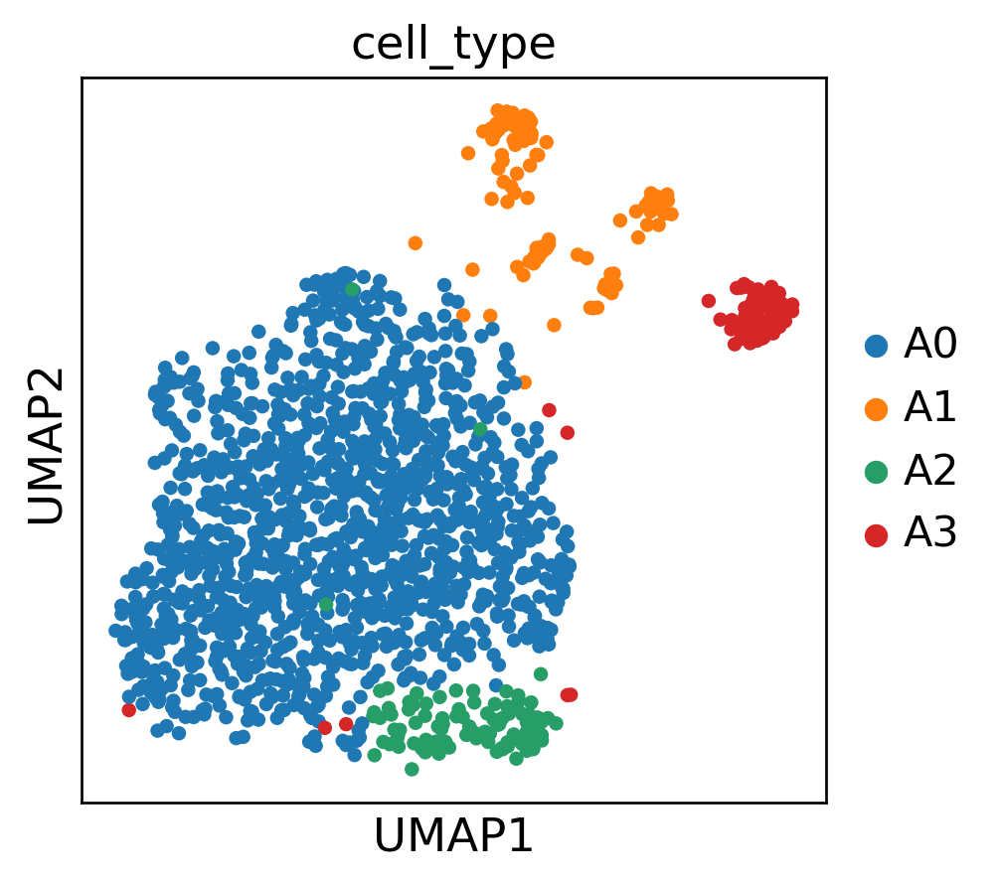

... storing 'cell_type' as categorical


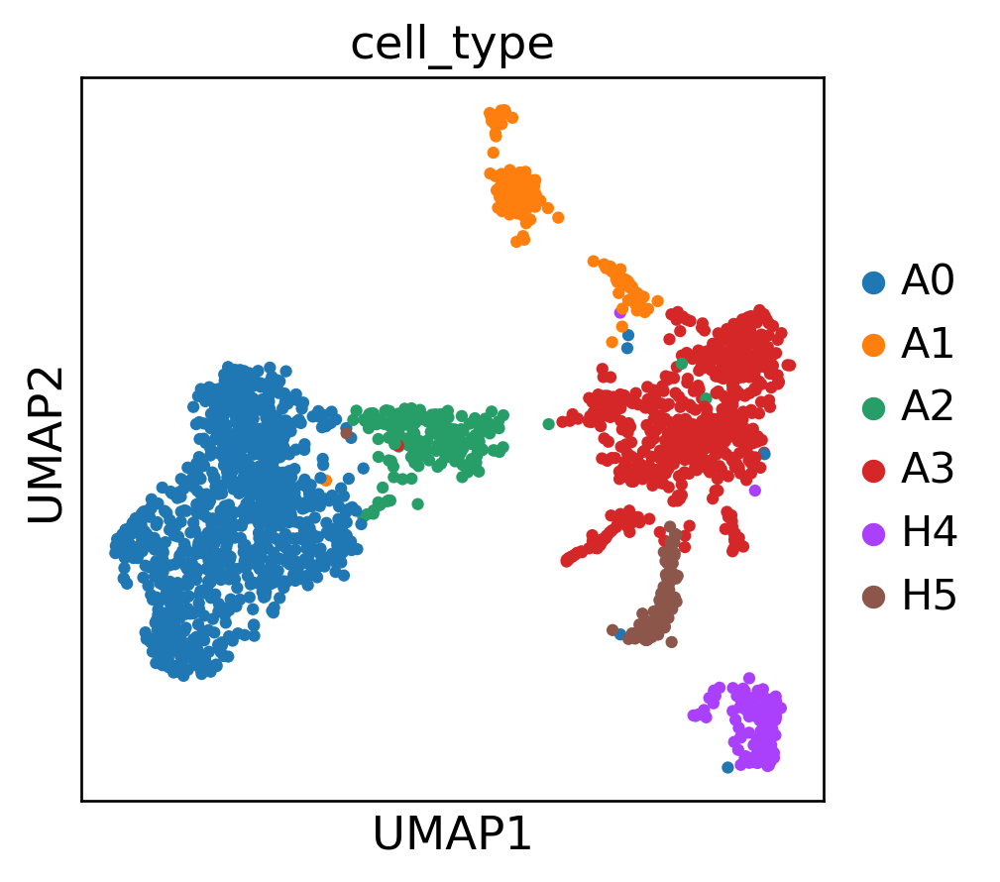

In [10]:
sc.pl.umap(adipocytes_sanger, color='cell_type')
sc.pl.umap(adipocytes_harvard, color='cell_type')

## Merge object

In [11]:
heart_adipocytes = adipocytes_harvard.concatenate(adipocytes_sanger, batch_key = 'cell_source', batch_categories = ['Harvard-Nuclei', 'Sanger-Nuclei'], join = 'outer')
heart_adipocytes.shape

(3799, 33538)

In [12]:
pd.crosstab(heart_adipocytes.obs['cell_source'], heart_adipocytes.obs['cell_type'])

cell_type,A0,A1,A2,A3,H4,H5
cell_source,,,,,,
Harvard-Nuclei,984,192,192,617,136,91
Sanger-Nuclei,1282,126,100,79,0,0


In [13]:
heart_adipocytes.obs['cell_type'] = heart_adipocytes.obs['cell_type'].astype('category')
heart_adipocytes.obs['cell_type'].cat.categories

Index(['A0', 'A1', 'A2', 'A3', 'H4', 'H5'], dtype='object')

## Normalise and log1p transform dataset

In [15]:
adipocytes_raw = heart_adipocytes.copy()
sc.pp.normalize_total(heart_adipocytes, target_sum=1e4)
sc.pp.log1p(heart_adipocytes)
heart_adipocytes.raw = heart_adipocytes.copy()

normalizing counts per cell
    finished (0:00:00)


In [16]:
heart_adipocytes

AnnData object with n_obs × n_vars = 3799 × 33538 
    obs: 'NRP', 'age_group', 'batch', 'cell_source', 'cell_states', 'cell_type', 'donor', 'gender', 'leiden', 'leiden_annotated', 'n_counts', 'n_genes', 'percent_mito', 'percent_ribo', 'region', 'sample', 'scrublet_score', 'source', 'type', 'version'
    var: 'gene_ids-Harvard-Nuclei-Harvard-Nuclei', 'feature_types-Harvard-Nuclei-Harvard-Nuclei', 'gene_ids-Sanger-Nuclei-Harvard-Nuclei', 'feature_types-Sanger-Nuclei-Harvard-Nuclei', 'gene_ids-Sanger-Cells-Harvard-Nuclei', 'feature_types-Sanger-Cells-Harvard-Nuclei', 'gene_ids-Sanger-CD45-Harvard-Nuclei', 'feature_types-Sanger-CD45-Harvard-Nuclei', 'gene_ids-Harvard-Nuclei-Sanger-Nuclei', 'feature_types-Harvard-Nuclei-Sanger-Nuclei', 'gene_ids-Sanger-Nuclei-Sanger-Nuclei', 'feature_types-Sanger-Nuclei-Sanger-Nuclei', 'gene_ids-Sanger-Cells-Sanger-Nuclei', 'feature_types-Sanger-Cells-Sanger-Nuclei', 'gene_ids-Sanger-CD45-Sanger-Nuclei', 'feature_types-Sanger-CD45-Sanger-Nuclei'
    uns: '

In [17]:
sc.pp.pca(heart_adipocytes, svd_solver='arpack', n_comps=50, random_state = 1786)

computing PCA with n_comps = 50
    finished (0:00:06)


... storing 'NRP' as categorical
... storing 'age_group' as categorical
... storing 'batch' as categorical
... storing 'cell_states' as categorical
... storing 'donor' as categorical
... storing 'leiden' as categorical
... storing 'leiden_annotated' as categorical
... storing 'sample' as categorical
... storing 'type' as categorical
... storing 'version' as categorical


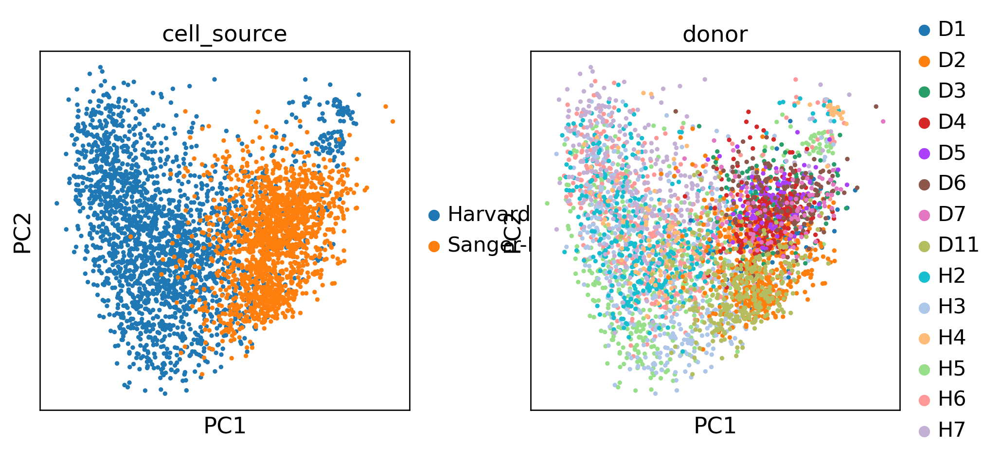

In [18]:
sc.pl.pca(heart_adipocytes, color=['cell_source','donor'])

## Run scGEN on source

In [19]:
hvg_scGen_batch_1 = heart_adipocytes.copy()
hvg_scGen_batch_1.obs["batch"] = heart_adipocytes.obs["cell_source"].tolist()
hvg_scGen_batch_1.obs["cell_type"] = heart_adipocytes.obs["cell_type"].tolist()

In [20]:
tf.reset_default_graph()
network_batch_1 = scgen.VAEArith(x_dimension = hvg_scGen_batch_1.shape[1], model_path = "./2-subpopulation_manifolds/adipocytes/")


For more information, please see:
  * https://github.com/tensorflow/community/blob/master/rfcs/20180907-contrib-sunset.md
  * https://github.com/tensorflow/addons
If you depend on functionality not listed there, please file an issue.

Instructions for updating:
Use keras.layers.dense instead.
Instructions for updating:
Colocations handled automatically by placer.
Instructions for updating:
Use keras.layers.batch_normalization instead.
Instructions for updating:
Use keras.layers.dropout instead.
Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
Instructions for updating:
Use tf.cast instead.


In [21]:
network_batch_1.train(train_data = hvg_scGen_batch_1, n_epochs = 10)

In [22]:
corrected_batch_1 = batch_removal_ct5(network_batch_1, hvg_scGen_batch_1)

computing neighbors
         Falling back to preprocessing with `sc.pp.pca` and default params.
computing PCA with n_comps = 50
    finished (0:00:05)
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:08)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:12)


... storing 'NRP' as categorical
... storing 'age_group' as categorical
... storing 'batch' as categorical
... storing 'cell_source' as categorical
... storing 'cell_states' as categorical
... storing 'cell_type' as categorical
... storing 'donor' as categorical
... storing 'leiden' as categorical
... storing 'leiden_annotated' as categorical
... storing 'region' as categorical
... storing 'sample' as categorical
... storing 'type' as categorical
... storing 'version' as categorical
... storing 'concat_batch' as categorical
findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.


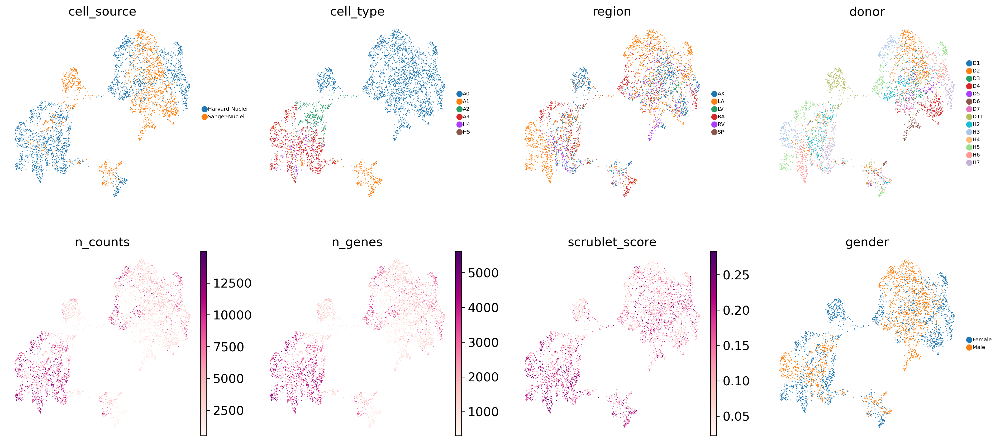

In [23]:
sc.pp.neighbors(corrected_batch_1, random_state = 1786)
sc.tl.umap(corrected_batch_1, min_dist = 0.4, spread = 1, random_state = 1786)
sc.pl.umap(corrected_batch_1, color = ['cell_source','cell_type','region','donor','n_counts','n_genes','scrublet_score','gender'], size = 4, legend_fontsize = 6, color_map = 'RdPu', frameon = False)

## Correct for donor

In [24]:
hvg_scGen_batch_2 = corrected_batch_1.copy()
hvg_scGen_batch_2.obs["batch"] = corrected_batch_1.obs["donor"].tolist()
hvg_scGen_batch_2.obs["cell_type"] = corrected_batch_1.obs["cell_type"].tolist()

In [25]:
tf.reset_default_graph()
network_batch_2 = scgen.VAEArith(x_dimension = hvg_scGen_batch_2.shape[1], model_path = "./2-subpopulation_manifolds/adipocytes/")

In [26]:
network_batch_2.train(train_data = hvg_scGen_batch_2, n_epochs = 10)

In [27]:
corrected_batch_2 = batch_removal_ct5(network_batch_2, hvg_scGen_batch_2)

computing PCA with n_comps = 50
    finished (0:00:05)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:09)


... storing 'NRP' as categorical
... storing 'age_group' as categorical
... storing 'batch' as categorical
... storing 'cell_source' as categorical
... storing 'cell_states' as categorical
... storing 'cell_type' as categorical
... storing 'donor' as categorical
... storing 'leiden' as categorical
... storing 'leiden_annotated' as categorical
... storing 'region' as categorical
... storing 'sample' as categorical
... storing 'type' as categorical
... storing 'version' as categorical


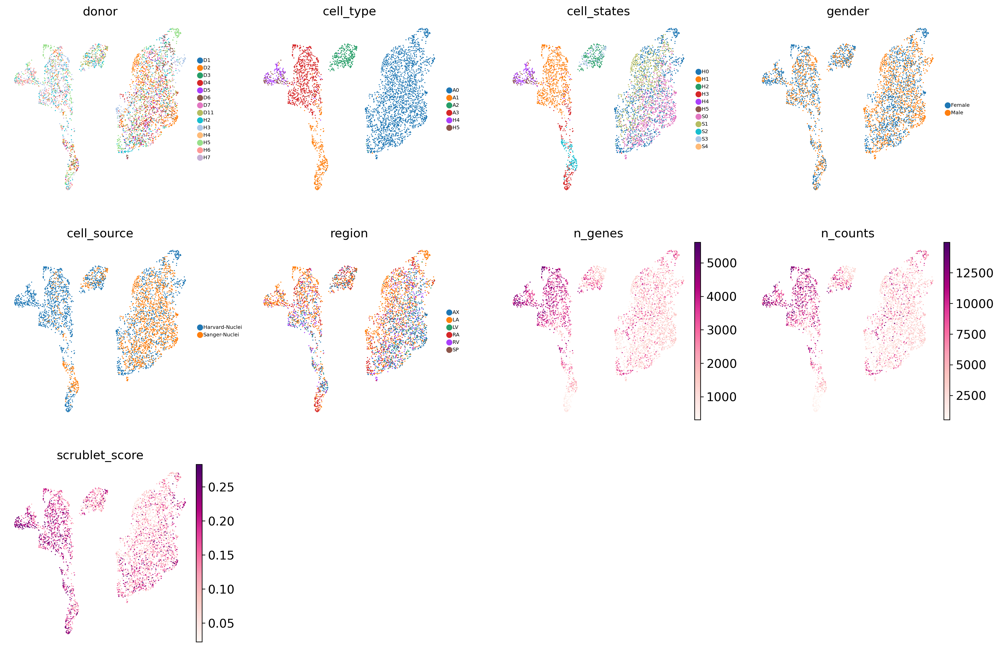

In [28]:
sc.pp.pca(corrected_batch_2, svd_solver='arpack', n_comps=50, random_state = 1786)
sc.pp.neighbors(corrected_batch_2, random_state = 1786)
sc.tl.umap(corrected_batch_2, min_dist = 0.6, spread = 3, random_state = 1786)
sc.pl.umap(corrected_batch_2, color = ['donor',  'cell_type','cell_states', 'gender', 'cell_source', 'region', 'n_genes', 'n_counts', 'scrublet_score'], size = 6, legend_fontsize = 6, color_map = 'RdPu', frameon = False)

## Call clusters using leiden

running Leiden clustering
    finished: found 4 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


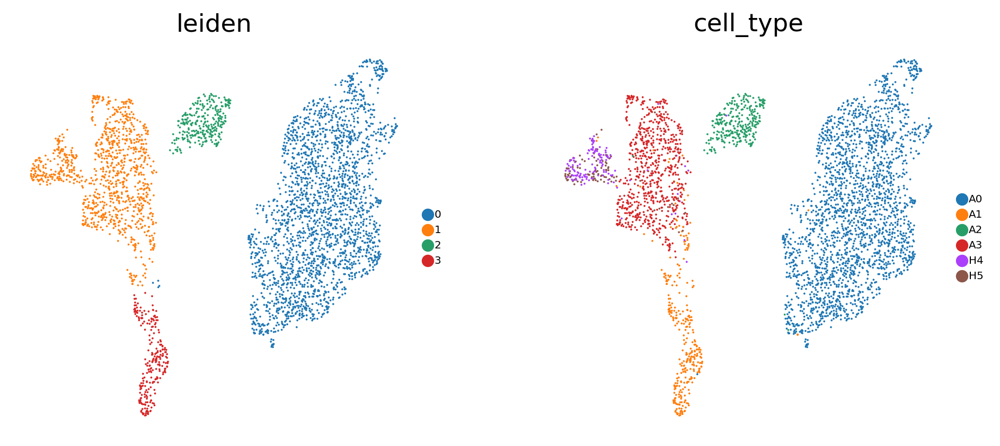

In [55]:
sc.tl.leiden(corrected_batch_2, resolution = 0.10, random_state = 1712)
sc.pl.umap(corrected_batch_2, color = ['leiden', 'cell_type'], size = 5, legend_fontsize = 6, color_map = 'RdPu', use_raw = True, frameon = False)

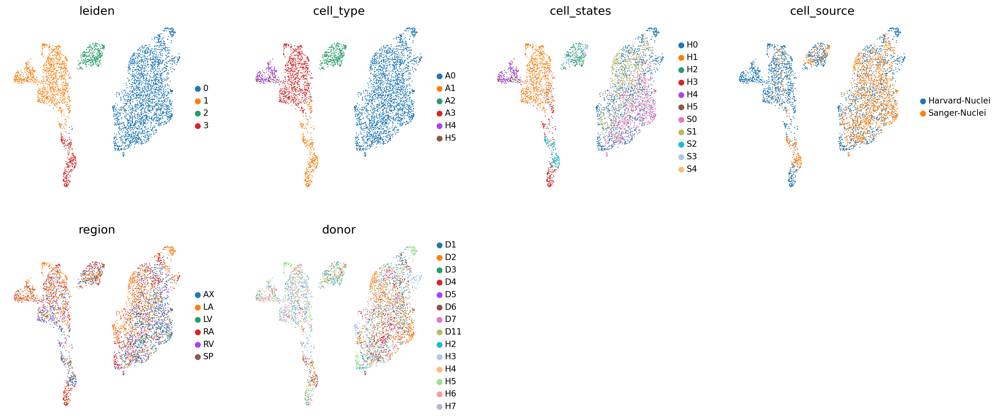

In [56]:
sc.pl.umap(corrected_batch_2, color = ['leiden', 'cell_type','cell_states', 'cell_source','region','donor'], size = 6, legend_fontsize = 10, color_map = 'RdPu', use_raw = True, frameon = False)

## Call markers

In [57]:
sc.tl.rank_genes_groups(corrected_batch_2, 'leiden', method = 'wilcoxon', n_genes = 500, use_raw = True)
result = corrected_batch_2.uns['rank_genes_groups']
groups = result['names'].dtype.names
markers_adipo = pd.DataFrame(
{group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names', 'pvals_adj', 'logfoldchanges']})
markers_adipo.head(10)

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:09)


,0_n,0_p,0_l,1_n,1_p,1_l,2_n,2_p,2_l,3_n,3_p,3_l
0,G0S2,2.581184e-80,1.594604,LAMA2,1.819461e-295,4.041743,NAMPT,2.213991e-85,3.170410,TTN,5.666956e-53,3.757832
1,AQP7,3.716012e-74,1.030145,NEGR1,2.384411e-266,4.422756,MT2A,6.403994e-74,3.589434,RYR2,8.622169e-53,3.742752
2,PDE3B,2.546475e-69,0.902959,CDH19,3.617640e-253,5.208636,SLC1A3,6.135693e-69,2.326607,MYBPC3,7.951137e-49,4.465931
3,GPAM,5.068104e-65,1.219448,PRKG1,2.861746e-238,3.497860,CDC42EP4,7.864839e-66,3.049637,ACTC1,2.742746e-43,3.513610
4,NEAT1,1.182048e-61,0.552248,DCLK1,1.237176e-215,4.410380,MT1X,1.618837e-63,2.769856,TNNT2,1.685631e-38,3.450974
5,PPARG,2.428834e-58,0.926283,ABCA9,5.526818e-215,3.512489,SLC39A14,4.924307e-63,3.235037,ANKRD1,1.156964e-37,4.090200
6,MGST1,4.624336e-55,0.581963,BICC1,8.503773e-208,3.846025,STAT3,5.009703e-62,2.138145,TPM1,7.780300e-28,2.736551
7,PNPLA2,6.851903e-54,0.720896,AKT3,1.767988e-203,3.282931,SOCS3,5.626598e-62,3.419974,LDB3,4.317472e-27,3.869190
8,PRKAR2B,1.643145e-53,1.114861,ABCA8,1.345289e-198,3.072943,GADD45B,5.787830e-52,2.457222,FGF12,1.051176e-26,3.376671
9,FABP4,2.759856e-51,1.151584,FBXL7,2.151267e-198,2.934213,SAA1,7.516130e-51,3.023080,MYH6,3.761315e-24,4.256917


In [58]:
sc.tl.filter_rank_genes_groups(corrected_batch_2, min_fold_change=1)

Filtering genes using: min_in_group_fraction: 0.25 min_fold_change: 1, max_out_group_fraction: 0.5


In [59]:
sc.tl.dendrogram(corrected_batch_2, groupby='leiden')

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_leiden']`


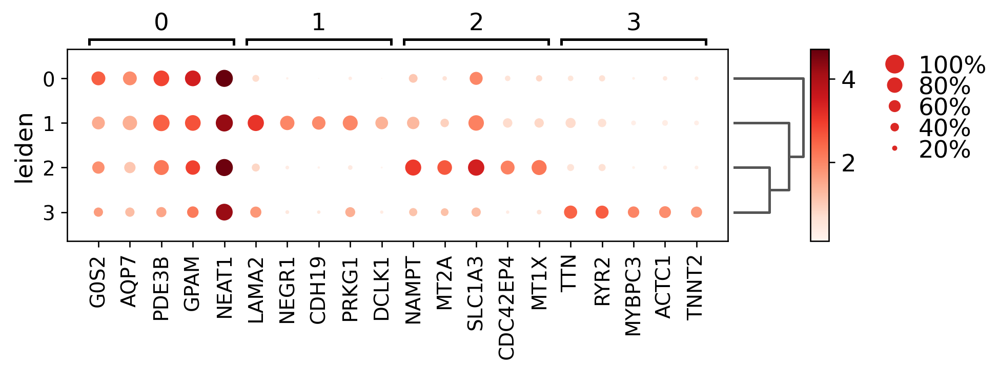

In [60]:
sc.pl.rank_genes_groups_dotplot(corrected_batch_2, key='rank_genes_groups', n_genes=5, use_raw=True)

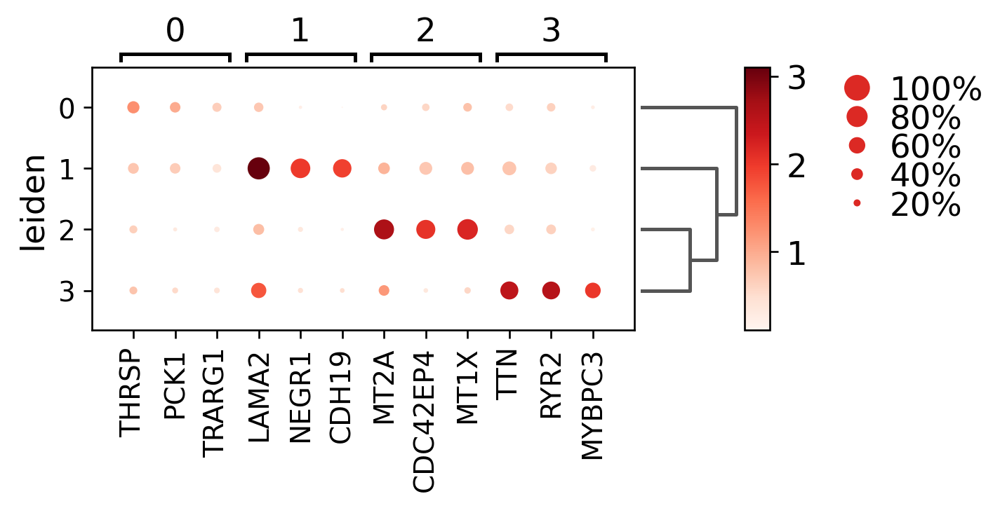

In [61]:
sc.pl.rank_genes_groups_dotplot(corrected_batch_2, key='rank_genes_groups_filtered',n_genes=3, use_raw=True)

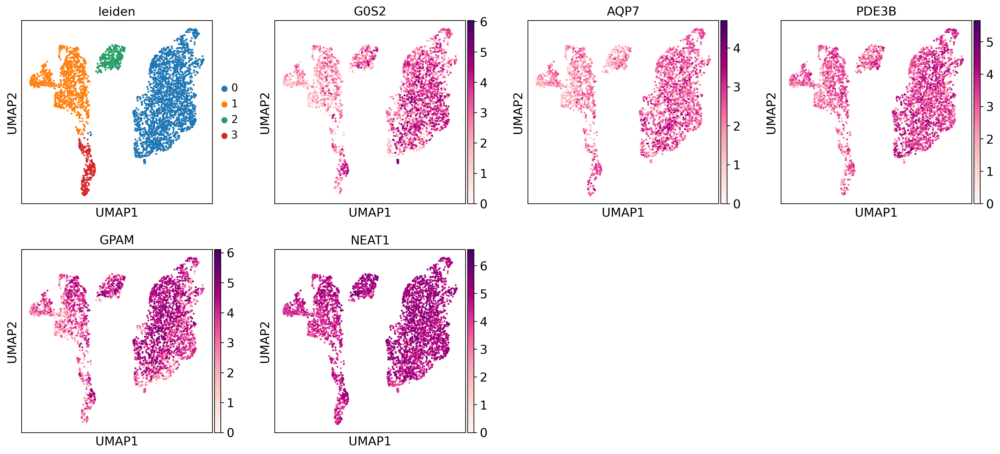

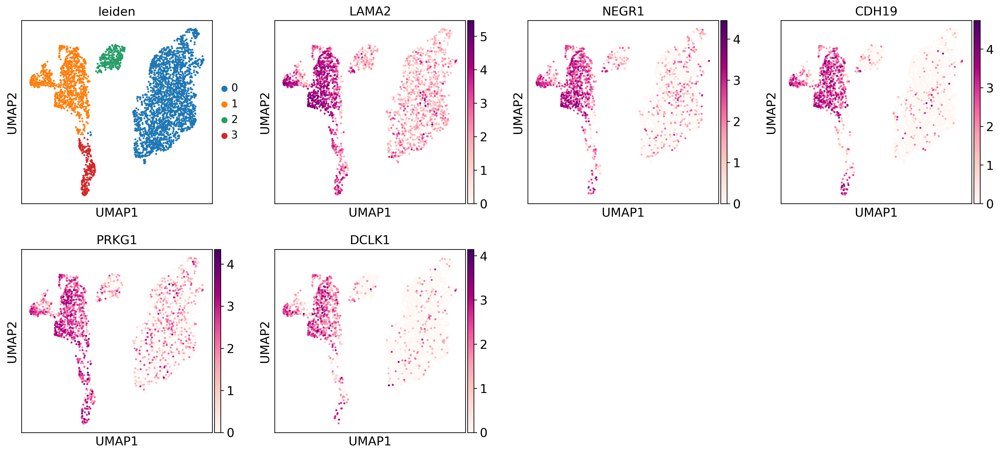

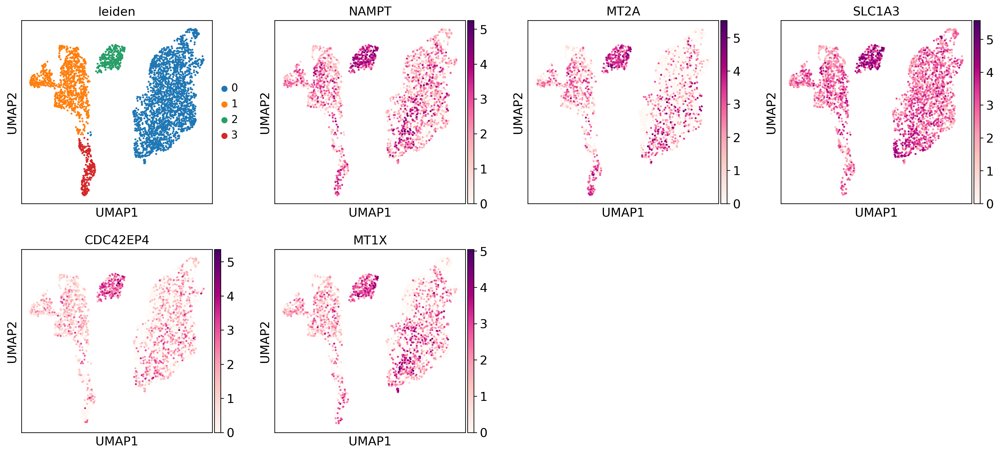

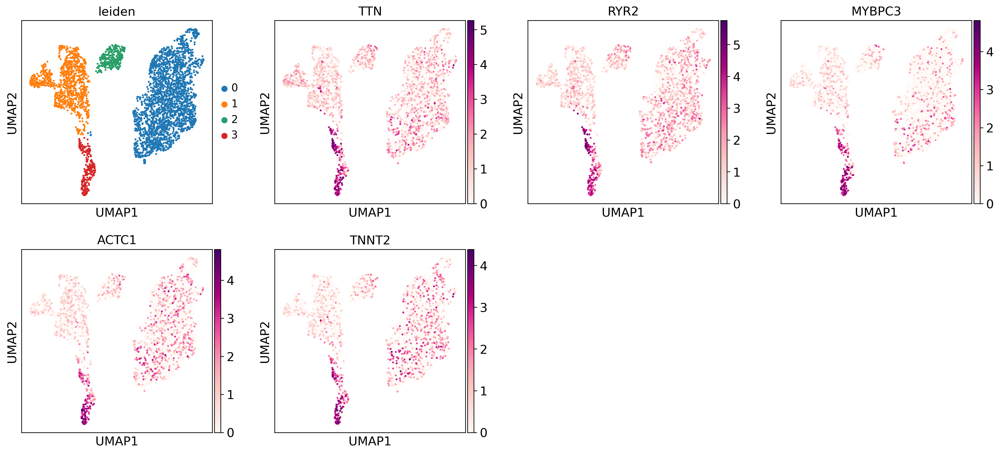

In [65]:
markers_adipod_df = pd.DataFrame(corrected_batch_2.uns['rank_genes_groups']['names']).head(5)
for i in corrected_batch_2.obs['leiden'].cat.categories.values.tolist():
    ax = sc.pl.umap(corrected_batch_2, color = ['leiden']+markers_adipod_df[i].values.tolist(), size = 20, legend_fontsize = 12)

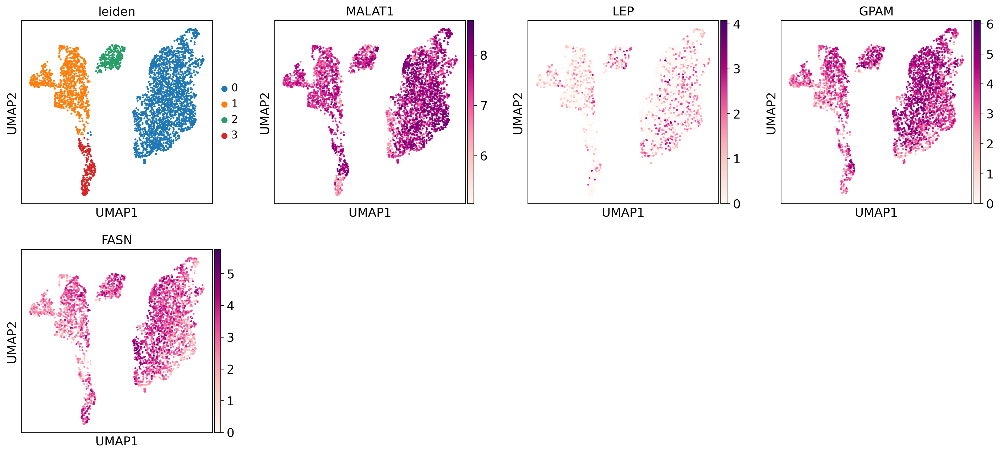

In [81]:
sc.pl.umap(corrected_batch_2, color = ['leiden','MALAT1','LEP','GPAM','FASN'], size = 20, legend_fontsize = 12, use_raw=True)

In [66]:
corrected_batch_2.raw.shape

(3799, 33538)

In [68]:
heart_adipocytes_out = anndata.AnnData(X = corrected_batch_2.X , obs = corrected_batch_2.obs, var = corrected_batch_2.var, obsm = corrected_batch_2.obsm)
heart_adipocytes_out.raw = adipocytes_raw
heart_adipocytes_out.write('./Output/heart_adipocytes_scGen_global_ct200422_ml200504.h5ad')